In [7]:
!pip install pdf2image -q
!apt-get install poppler-utils
!pip install easyocr -q

from pdf2image import convert_from_path

import easyocr
reader=easyocr.Reader(['en'])

import PIL
from PIL import ImageDraw

import re
import pandas as pd
import os

Reading package lists... Done
Building dependency tree       
Reading state information... Done
poppler-utils is already the newest version (0.62.0-2ubuntu2.14).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 5 not upgraded.


In [17]:
def pdftoimg(pdf_path, img_path):
  pages = convert_from_path(pdf_path, 500)
  for page in pages:
      page.save(img_path, 'JPEG')

In [18]:
#Conveting PDF file to Image file
pdftoimg(pdf_path='/content/drive/MyDrive/example.pdf', img_path='/content/drive/MyDrive/Image.jpg')

In [19]:
def extract_text(img_path):
  im=PIL.Image.open(img_path)
  bounds=reader.readtext(img_path)

  text=''
  for i in range(len(bounds)):
    text=text+bounds[i][1]+ '\n'

  return(bounds)


In [ ]:
#Use GPU for faster processing 
bounds=extract_text('/content/drive/MyDrive/Image.jpg')

In [41]:
def draw_boxes(img_path,bounds,color = 'yellow',width = 3):
  image=PIL.Image.open(img_path)
  draw = ImageDraw.Draw(image)
  for bound in bounds:
    p0,p1,p2,p3 = bound[0]
    draw.line([*p0,*p1,*p2,*p3], fill = color,width = 2)
  return image

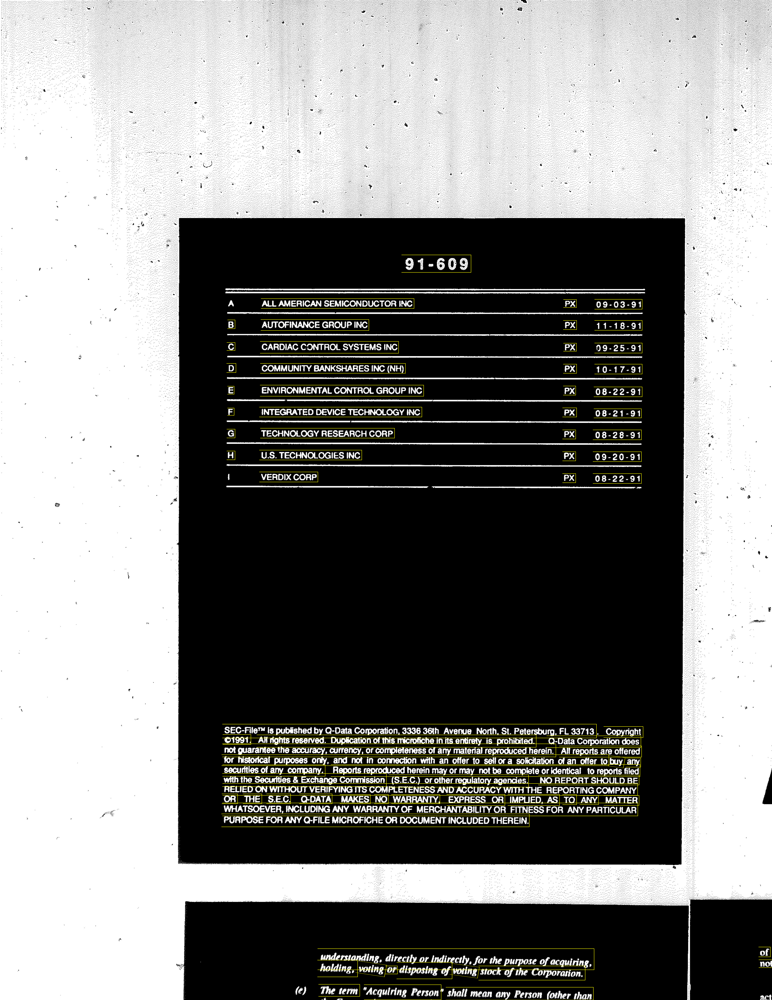

In [42]:
draw_boxes('/content/drive/MyDrive/Image.jpg', bounds)

In [43]:
#Creating Table
name=[]
date=[]
for i in range(len(bounds)):
  if re.match('SEC-F', bounds[i][1]):
    break
  if re.match('[A-z][A-z]', bounds[i][1].replace(" ", "")):
    if bounds[i][1] not in ['PX','pX','px','Px']:
      name.append(bounds[i][1])
      date.append(bounds[i+2][1].replace(" ", ""))  

In [44]:
Data=pd.DataFrame(zip(name,date), columns=['Name', 'Date'] )
Data['Letter'] = Data.index.to_series().apply(lambda x: chr(ord('a') + x)).str.upper()
Data['Fisch No']=bounds[0][1].replace(" ",'')
Data[['Letter', 'Name', 'Date', 'Fisch No']]

,Letter,Name,Date,Fisch No
0,A,ALL AMERICAN SEMKCONDUCTOA INC,09-03-91,91-609
1,B,AUTOFINANCE GROUP INC,11-18-91,91-609
2,C,CAADIAC CONTROL SYSTEMS INC,09-25-91,91-609
3,D,COMMUNITY BANKSHARES INC (NH),10-17-91,91-609
4,E,ENVIRCNMENTAL CONTROL GROUP INC,08-22-91,91-609
5,F,INTEGRMATED DEVICE TECHNOLOGY INC,08-21-91,91-609
6,G,TECKNOLOGY RESEARCH CORP,08-28-91,91-609
7,H,US. TECHNOLOGIES INC,09-20-91,91-609
8,I,VERDIX CORP,08-22-91,91-609
